In [1]:
import numpy as np
import math
import os
import pygmt
import pandas as pd
from scipy import integrate
import matplotlib.pyplot as plt
%matplotlib inline
import sys
sys.path.append('./src')
from ridgetools import *

# Bathymetry and rock-equivalent topography inputs

In the topo_stress routine, the input bathymetry grid is a cut region of topo.eqrk.img (`gmt grdinfo` for more).

## Unfiltered
First, here's the raw bathymetry (not rock equivalent topo) in the Galapagos testing area.

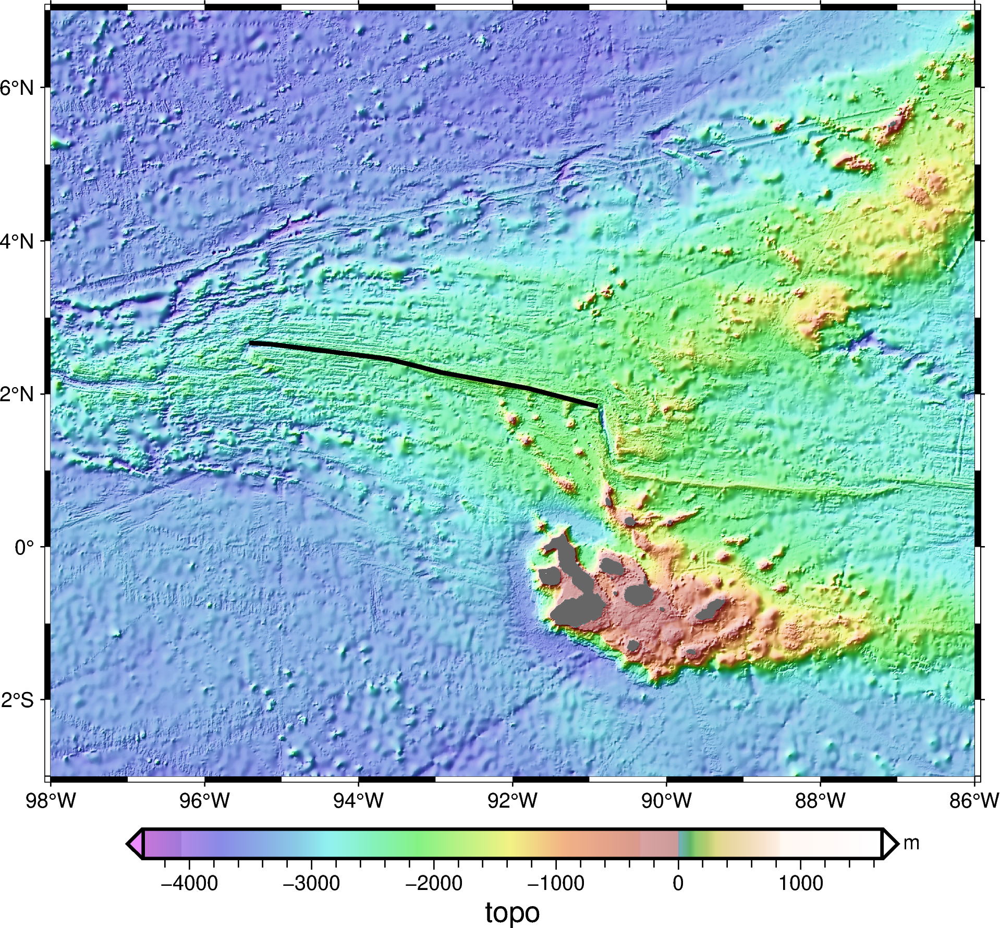

In [3]:
region = [-98, -86, -3, 7]
fig = pygmt.Figure()
fig.basemap(region=region, projection="M15c",frame=True)
fig.grdimage(grid='/Users/huharper/03_topo-stress/galapagos.topo.nc',cmap='topo',shading='+d')
fig.coast(land="#666666")
fig.colorbar(position='+e',frame=['x+ltopo','y+lm'])
filename = os.getcwd() + "/segments/Test/Galapagos-west.txt"
myRidge = load_one_ridge(filename)
fig.plot(x=myRidge.iloc[:,0],y=myRidge.iloc[:,1],pen='2p,black')
fig.show()

Here's the rock-equivalent topography, the applied load on the top of the crust. The unfiltered load is dominated by the long wavelength negative load.

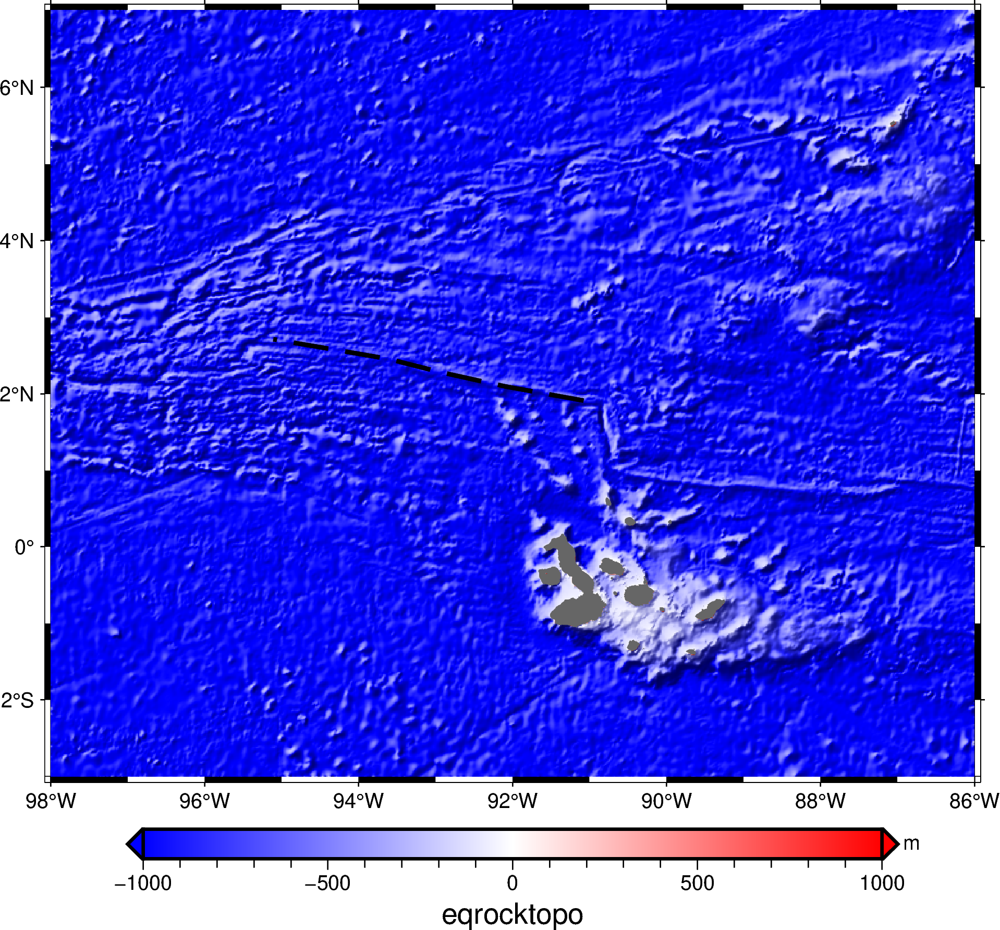

In [3]:
region = [-98, -86, -3, 7]
grid = '/Users/huharper/03_topo-stress/galapagos.nc'

gmt_fig = gmt_gridplot(region,grid)
gmt_fig.colorbar(
    position='+e',
    frame=['x+leqrocktopo','y+lm']
)
gmt_fig.plot(x=myRidge.iloc[:,0],y=myRidge.iloc[:,1],pen='2p,black,--')
gmt_fig.show()

## High-pass filtered, SH taper: 60-70; $\lambda$ = 600 km

This filter has a cosine taper from spherical harmonics 60-70 (around the 600 km wavelength). The filter is applied with the img_filter program: `img_filter topo.eqrk.img -HhL/H -Otopo.eqrk.L.H.img`. Now some positive loading is evident along the western ridge.

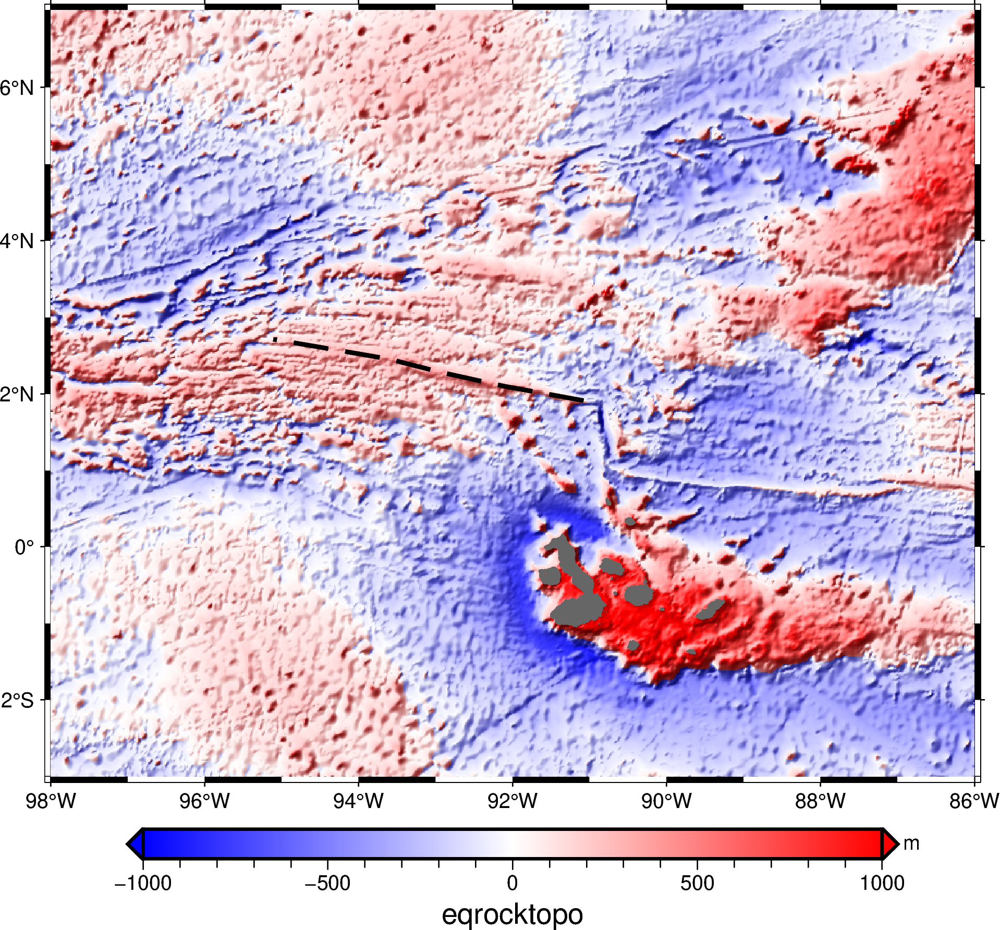

In [4]:
region = [-98, -86, -3, 7]
grid = '/Users/huharper/03_topo-stress/galapagos.60.70.nc'

gmt_fig = gmt_gridplot(region,grid)
gmt_fig.colorbar(
    position='+e',
    frame=['x+leqrocktopo','y+lm']
)
gmt_fig.plot(x=myRidge.iloc[:,0],y=myRidge.iloc[:,1],pen='2p,black,--')
gmt_fig.show()

## SH taper: 80-100; $\lambda$ = 500..400 km
Slightly different filter, the taper is moved to spherical harmonics 80-100. The shorter wavelength variations become apparent in the load.

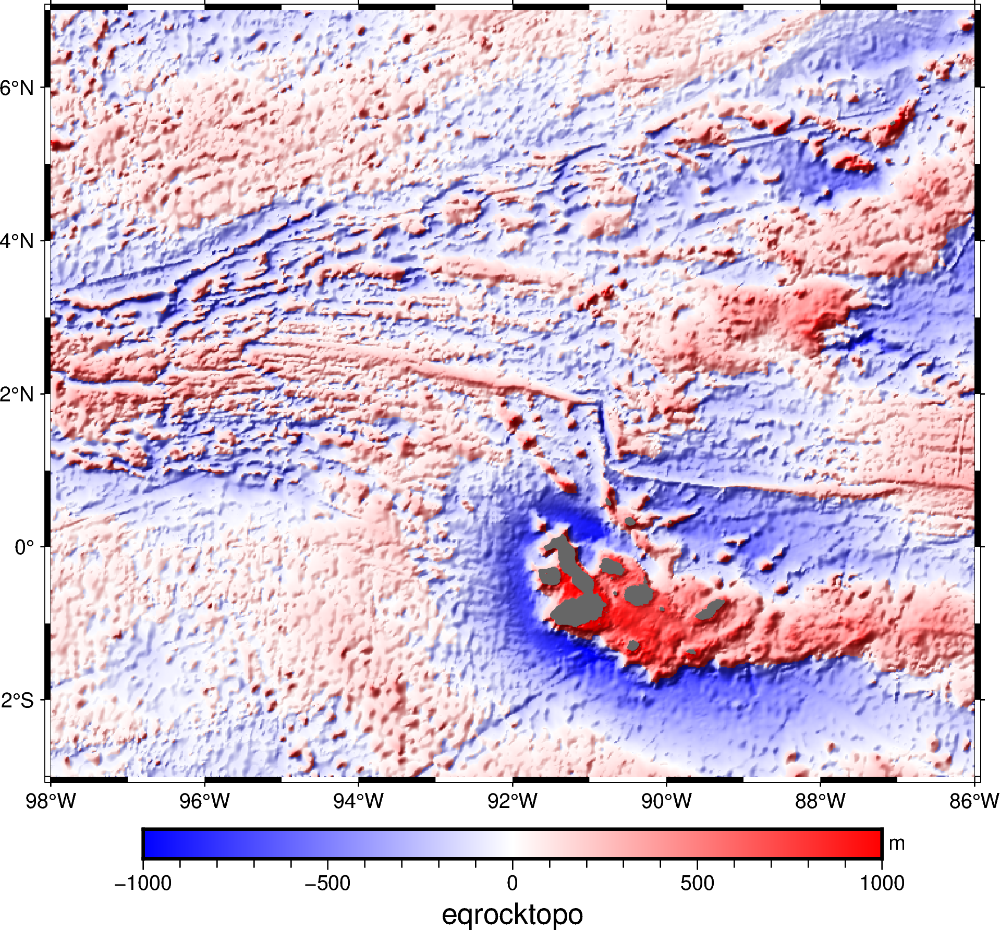

In [5]:
region = [-98, -86, -3, 7]
grid = '/Users/huharper/03_topo-stress/galapagos.80.100.nc'
gmt_fig = gmt_gridplot(region,grid)
gmt_fig.colorbar(
    frame=['x+leqrocktopo','y+lm']
)
gmt_fig.show()

## SH taper: 100-140, $\lambda$ = 400..280 km
This is the taper from Luttrell and Sandwell (2012). Qualitatively, it looks similar to the previous grid.

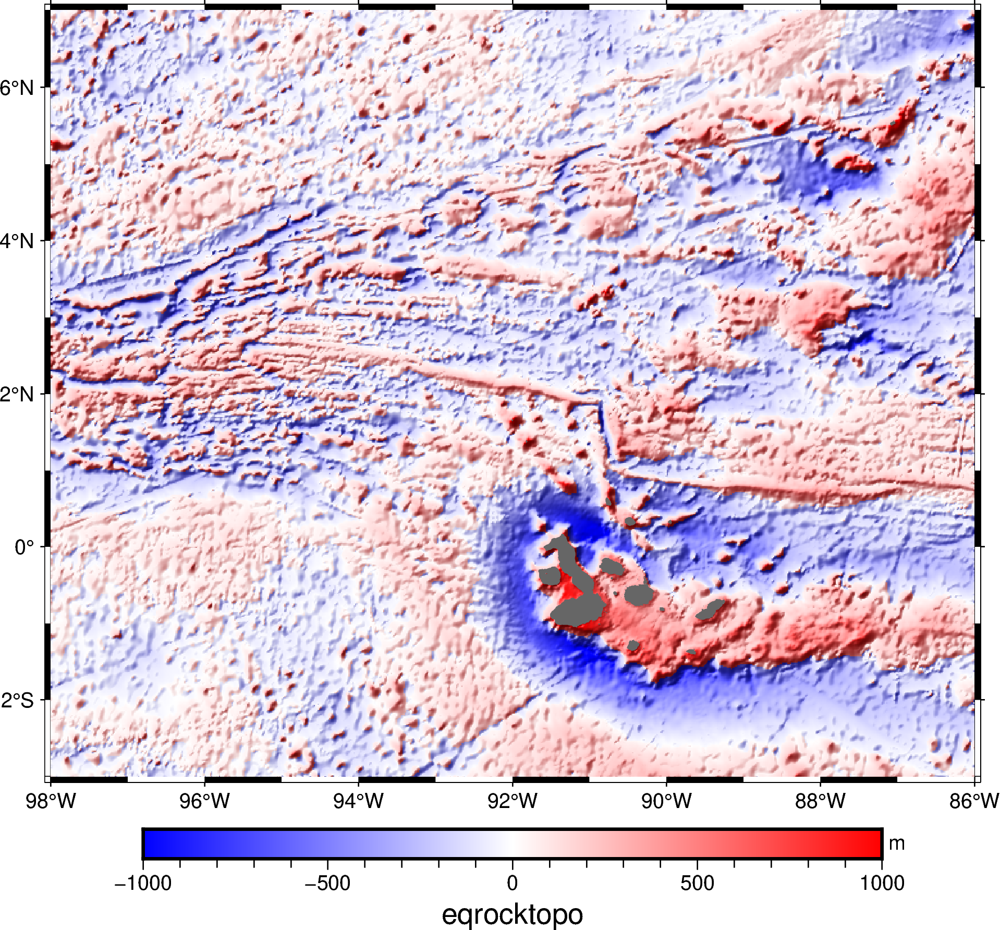

In [6]:
region = [-98, -86, -3, 7]
grid = '/Users/huharper/03_topo-stress/galapagos.100.140.nc'
gmt_fig = gmt_gridplot(region,grid)
gmt_fig.colorbar(
    frame=['x+leqrocktopo','y+lm']
)
gmt_fig.show()